# SMAI

## Assignment 5

### Question 1
### Kernal Density Estimation

In this assignment, we will be implementing the kernal density estimation algorithm. Following is the implementation of the class for KDE.

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import ast
from scipy.signal import find_peaks
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [3]:
class KDE:

    def __init__(self, kernel = 'gaussian'):
        self.kernel = kernel
        self.data = None
        self.bandwidth = 1.0

    def fit(self, data, bandwidth=None):
        self.data = np.array(data)
        if bandwidth is None:
            self.bandwidth = self.select_bandwidth(self.data)
        else:
            self.bandwidth = bandwidth

    def kernel_function(self, x, xi):
        if self.kernel == 'gaussian':
            exponent = -0.5 * np.sum(((x - xi) / self.bandwidth) ** 2)
            return np.exp(exponent - 0.5 * len(x) * np.log(2 * np.pi) - np.sum(np.log(self.bandwidth)))
        elif self.kernel == 'box':
            return np.prod(0.5 / self.bandwidth * (np.abs((x - xi) / self.bandwidth) <= 1))
        elif self.kernel == 'triangular':
            return np.prod((1 - np.abs((x - xi) / self.bandwidth)) / self.bandwidth)

    def select_bandwidth(self, data):
        candidate_bandwidths = np.linspace(0.1, 5.0, 100)
        optimal_bandwidth = max(candidate_bandwidths, key=lambda bw: self.compute_pseudo_likelihood(data, bw))

        return optimal_bandwidth
        

    def compute_pseudo_likelihood(self, data, bandwidth):
        n, d = data.shape
        self.bandwidth = bandwidth
        log_likelihoods = []

        for i in range(n):
            data_minus_i = np.delete(data, i, axis=0)
            kde_values = np.zeros_like(data_minus_i, dtype=float)

            for j in range(n - 1):
                kernel_value = self.kernel_function(data[i], data_minus_i[j])
                if kernel_value > 0: 
                    kde_values[j] = np.sum(np.log(kernel_value))

            log_likelihood = np.sum(kde_values)
            log_likelihoods.append(log_likelihood)

        return np.mean(log_likelihoods)


    def evaluate_density(self, x):
        x = np.array(x)
        n, d = self.data.shape
        if len(x.shape) == 2:
            density = np.zeros(len(x), dtype=float)
        else:
            density = 0.0

        for i in range(n):
            density += self.kernel_function(x, self.data[i])

        return density / n

    def visualize(self, num_points = 100, plot = True):
        range_x = [(np.min(self.data[:, i]), np.max(self.data[:, i])) for i in range(self.data.shape[1])]

        meshgrid = np.meshgrid(*[np.linspace(range_x[i][0], range_x[i][1], num_points) for i in range(self.data.shape[1])])
        x_values = np.column_stack([coord.ravel() for coord in meshgrid])
        y_values = [self.evaluate_density(X) for X in x_values]

        if plot:
            if self.data.shape[1] == 1:
                plt.plot(x_values, y_values, label="KDE")
                plt.hist(self.data, density=True, alpha=0.5, label="Histogram")
            elif self.data.shape[1] == 2:
                plt.contourf(meshgrid[0], meshgrid[1], np.array(y_values).reshape(meshgrid[0].shape), cmap="viridis", levels=20, alpha=0.8)
                plt.scatter(self.data[:, 0], self.data[:, 1], label="Data")

            plt.legend()
            plt.show()

        return x_values, y_values

Now that we have implemented the kde class, let us check out some of the images of paragraphs given to us.

In [4]:
df = pd.read_csv('CSV/TLBR_68.csv')
print(df.head())

   Unnamed: 0    Top-Left Bottom-Right  Id
0           0   [290, 85]   [435, 147]   0
1           1   [563, 82]   [730, 147]   1
2           2   [744, 92]   [940, 140]   2
3           3  [1163, 92]  [1184, 147]   3
4           4  [1218, 79]  [1344, 157]   4


In [5]:
img = cv2.imread('images/68.jpg')

In [4]:
def visualize_bboxes(img, df):
  img_2 = img.copy()
  for index, rows in df.iterrows():
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)
    plt.imshow(img_2)

In [5]:
def make_connections(image,euclidean):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  image_with_boxes = image_rgb.copy()

  for index, row in euclidean.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)

      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

      label_position = (left, top - 10)
      cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top_Box'][1])
      bottom_adjacent_id = int(row['Bottom_Box'][1])
      left_adjacent_id = int(row['Left_Box'][1])
      right_adjacent_id = int(row['Right_Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = euclidean[euclidean['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = euclidean[euclidean['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

      if left_adjacent_id != 0:
          left_adjacent_row = euclidean[euclidean['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

      if right_adjacent_id != 0:
          right_adjacent_row = euclidean[euclidean['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

  return image_with_boxes

Let us take a look at how the bounding boxes look for the chosen image and its csv file.

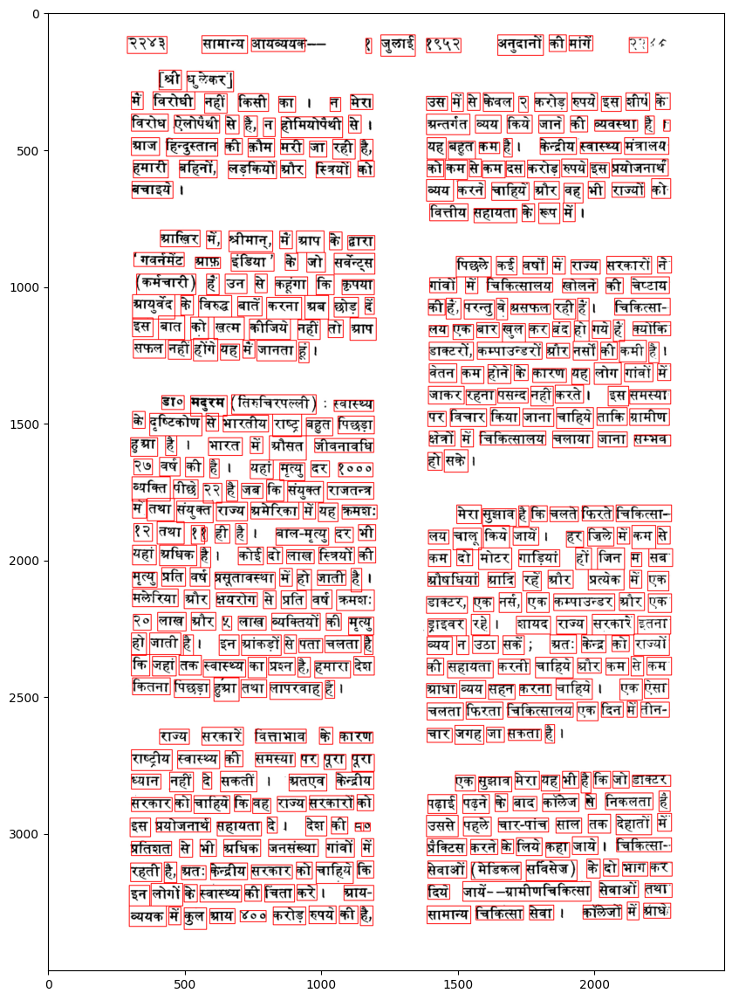

In [8]:
plt.figure(figsize = (10, 15))
visualize_bboxes(img, df)

So, now we shall compute the center, top edge, bottom edge, right edge and left edge coordinate values of every bounding box using the data given to us in the CSV file.

In [6]:
def get_centres(Top_left, bottom_right):
    centres = np.zeros((len(df), 2))

    for i in range(len(df)):
        x_coordinate = (Top_left[i][0] + bottom_right[i][0])//2
        y_coordinate = (Top_left[i][1] + bottom_right[i][1])//2

        centres[i][0] = x_coordinate
        centres[i][1] = y_coordinate

    return centres

def get_top_edge(top_left, bottom_right):
    top_edge = np.zeros((len(df), 2))

    for i in range(len(df)):
        x_coordinate = (top_left[i][0] + bottom_right[i][0])//2
        y_coordinate = top_left[i][1]

        top_edge[i][0] = x_coordinate
        top_edge[i][1] = y_coordinate

    return top_edge

def get_bottom_edge(top_left, bottom_right):
    bottom_edge = np.zeros((len(df), 2))

    for i in range(len(df)):
        x_coordinate = (top_left[i][0] + bottom_right[i][0])//2
        y_coordinate = bottom_right[i][1]

        bottom_edge[i][0] = x_coordinate
        bottom_edge[i][1] = y_coordinate

    return bottom_edge

def get_right_edge(top_left, bottom_right):
    right_edge = np.zeros((len(df), 2))

    for i in range(len(df)):
        x_coordinate =  bottom_right[i][0]
        y_coordinate = (bottom_right[i][1] + top_left[i][1])//2

        right_edge[i][0] = x_coordinate
        right_edge[i][1] = y_coordinate

    return right_edge


def get_left_edge(top_left, bottom_right):
    left_edge = np.zeros((len(df), 2))

    for i in range(len(df)):
        x_coordinate =  top_left[i][0]
        y_coordinate = (bottom_right[i][1] + top_left[i][1])//2

        left_edge[i][0] = x_coordinate
        left_edge[i][1] = y_coordinate

    return left_edge



In [10]:
Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

Now let us use KDE to get the distribution of every word in the image.

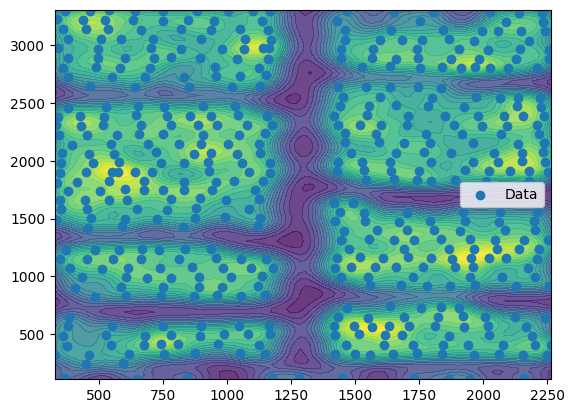

In [11]:
kde1 = KDE(kernel = 'gaussian')
kde1.fit(centres, bandwidth=70)
x, y = kde1.visualize()

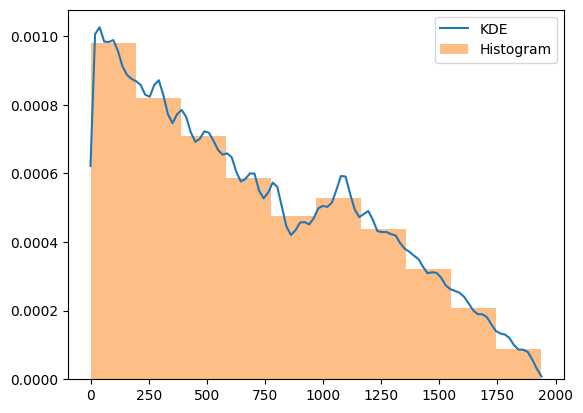

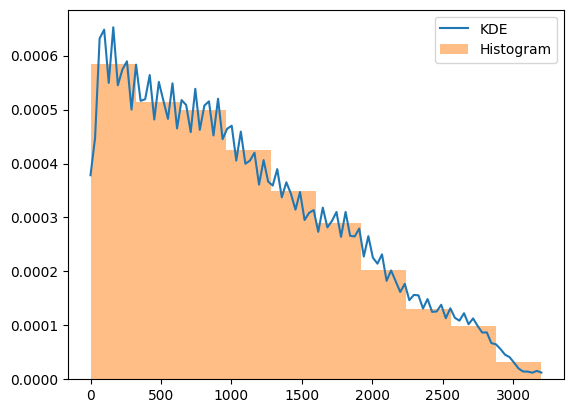

In [12]:
kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=15)
x_horizontal, y_horizontal = kde3.visualize()

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=30)
x_vertical, y_vertical = kde2.visualize()

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

In [13]:
if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[1]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100

print('Horizontal Threshold',horizontal_threshold[0])
print('Vertical Threshold',vertical_threshold[0])

Horizontal Threshold 97.92929292929293
Vertical Threshold 97.0


In [7]:
def get_top_box(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if i!=j:
                if df['Bottom'][j][1] < df['Top'][i][1]:
                    

                    dist = np.linalg.norm(np.array(df['Top'][i]) - np.array(df['Bottom'][j]))
                    dist_x = np.abs(df['Bottom'][j][0] - df['Top'][i][0])
                    dist_y = np.abs(df['Bottom'][j][1] - df['Top'][i][1])

                    if dist_x<horizontal_threshold and dist_y < vertical_threshold and dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_bottom_box(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0



    for i in range(len(df)):
        for j in range(len(df)):
            
            if i!=j:
                if df['Top'][j][1] > df['Bottom'][i][1]:

                    dist = np.linalg.norm(np.array(df['Bottom'][i]) - np.array(df['Top'][j]))
                    dist_x = np.abs(df['Bottom'][i][0] - df['Top'][j][0])
                    dist_y = np.abs(df['Bottom'][i][1] - df['Top'][j][1])
                    
                    if dist_x<horizontal_threshold and dist_y < vertical_threshold and dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_right_box(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if i!=j:
                if df['Left'][j][0] > df['Right'][i][0]:

                    dist = np.linalg.norm(np.array(df['Right'][i]) - np.array(df['Left'][j]))
                    dist_x = np.abs(df['Right'][i][0] - df['Left'][j][0])
                    dist_y = np.abs(df['Right'][i][1] - df['Left'][j][1])
                    

                    if dist_x<horizontal_threshold and dist_y < vertical_threshold and dist<min and dist != 0:
                        min = dist
                        idx = j


        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_left_box(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if i!=j:
                if df['Right'][j][0] < df['Left'][i][0]:

                    dist = np.linalg.norm(np.array(df['Left'][i]) - np.array(df['Right'][j]))
                    dist_x = np.abs(df['Left'][i][0] - df['Right'][j][0])
                    dist_y = np.abs(df['Left'][i][1] - df['Right'][j][1])

                    if dist_x<horizontal_threshold and dist_y < vertical_threshold and dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances



In [15]:
df = pd.read_csv('CSV/TLBR_68.csv')
img = cv2.imread('images/68.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

Now let us visualise the passage with the connections between the bounding boxes

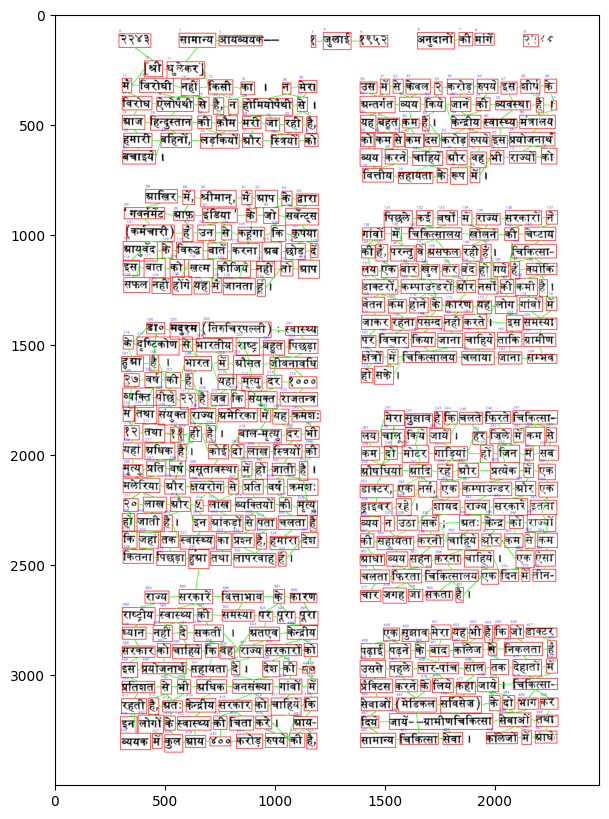

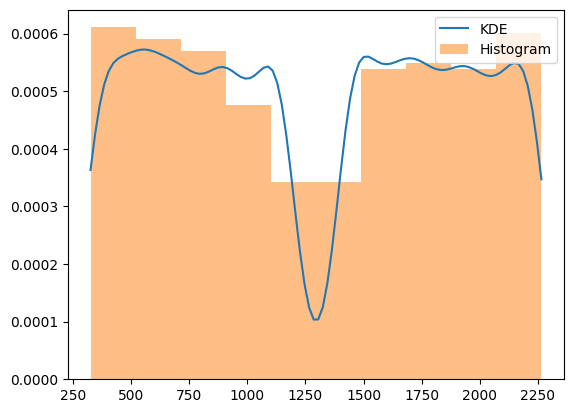

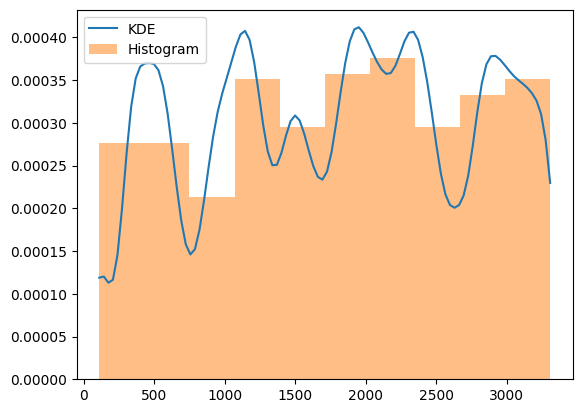

In [20]:
img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()


Now let us perform this for 3 other images

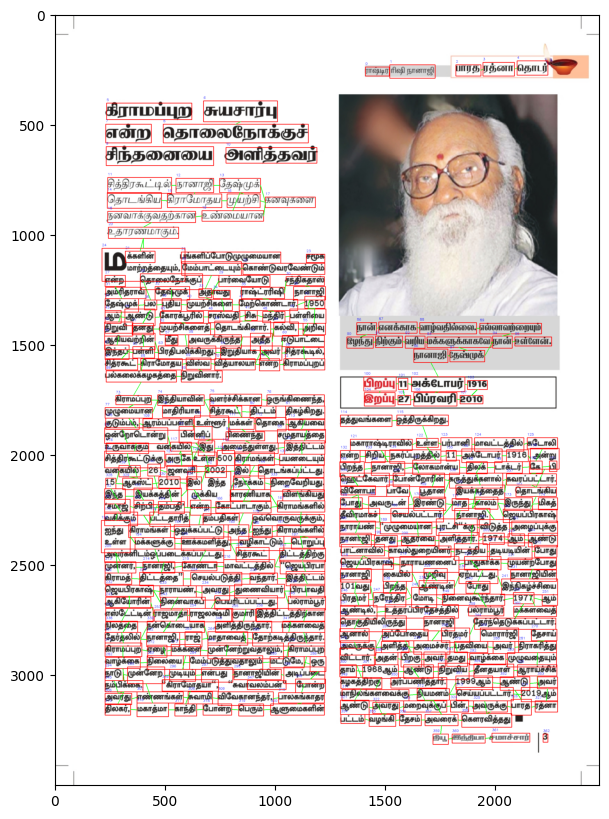

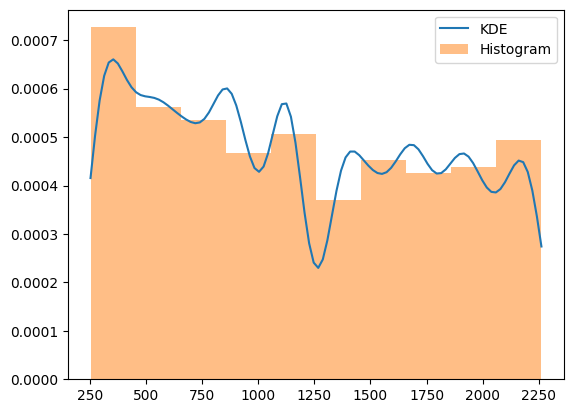

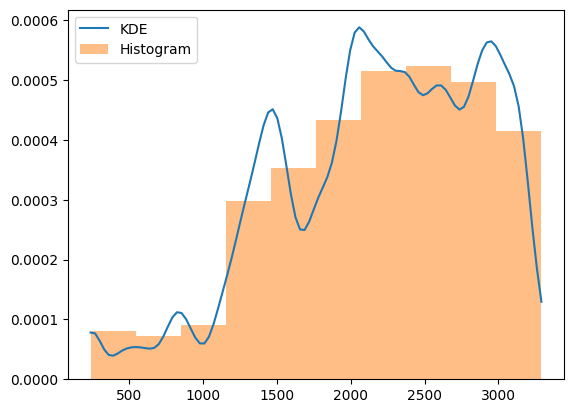

In [9]:
df = pd.read_csv('CSV/TLBR_201.csv')
img = cv2.imread('images/201.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=15)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=30)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[2]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1 = KDE()
kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

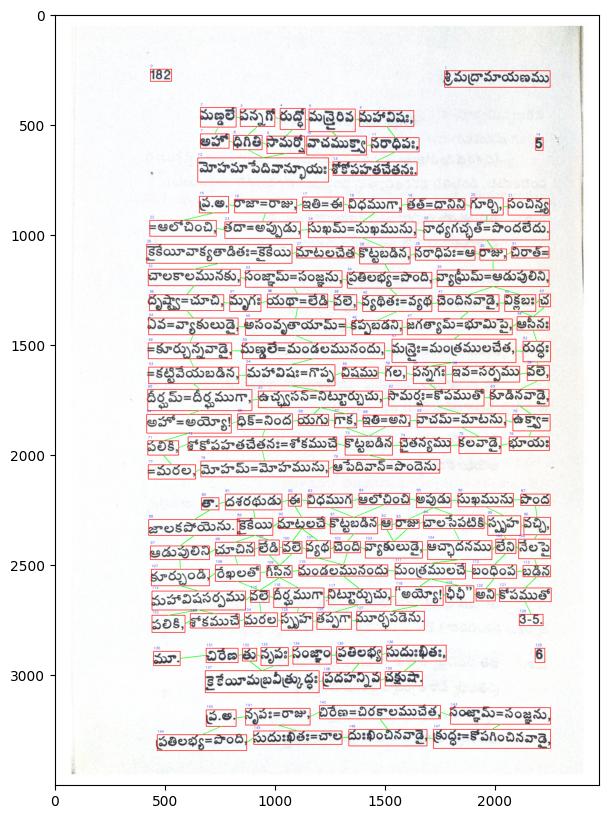

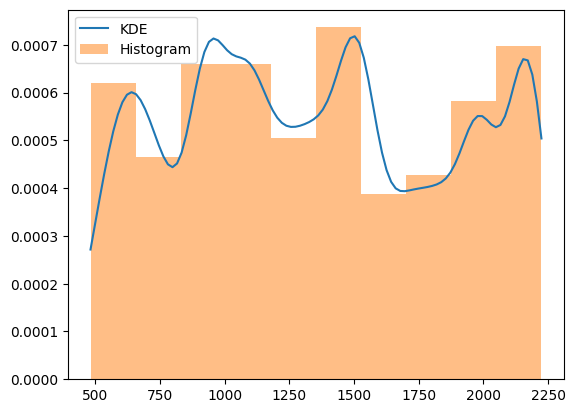

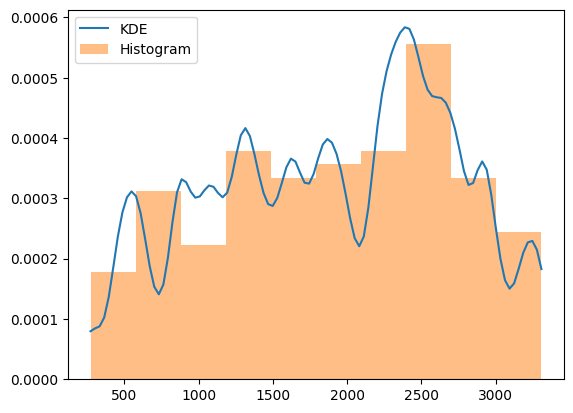

In [13]:
df = pd.read_csv('CSV/TLBR_152.csv')
img = cv2.imread('images/152.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=15)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=30)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[1]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[2] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

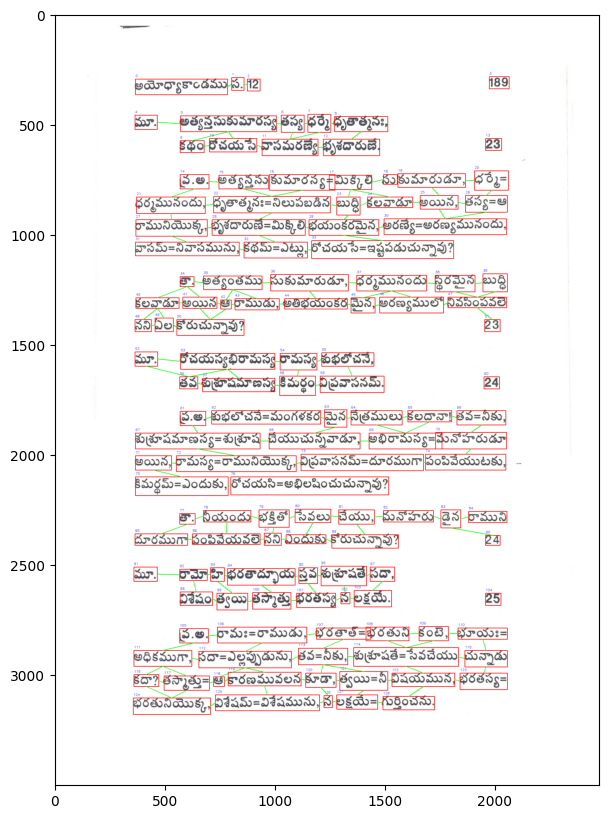

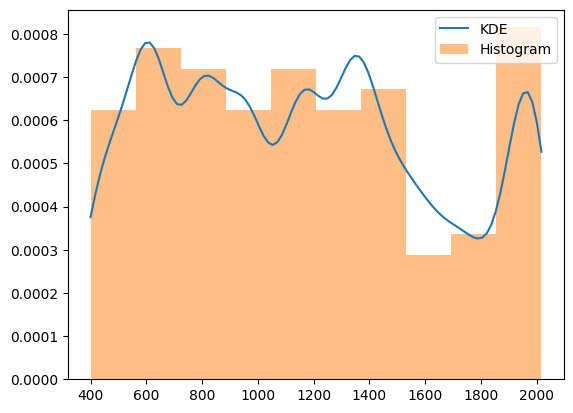

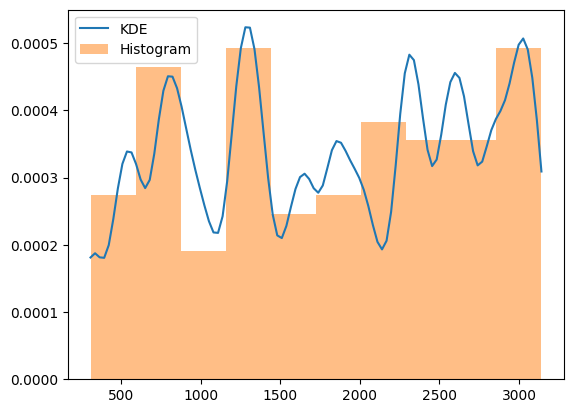

In [14]:
df = pd.read_csv('CSV/TLBR_159.csv')
img = cv2.imread('images/159.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=15)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=30)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[1]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[2] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

Now that we have applied our algorithm or 4 different images, on the same image, let us change the bandwidth of our KDEs and test it again. This time we will use a higher KDE value

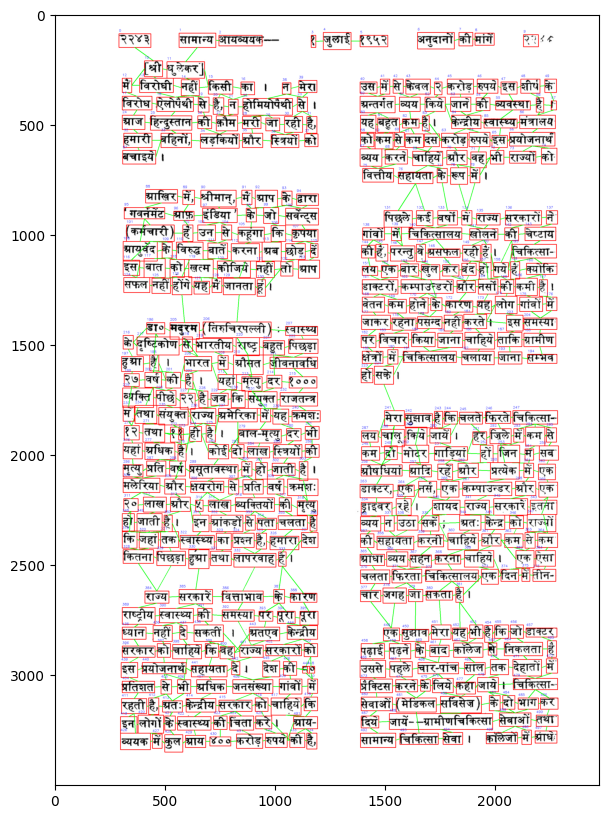

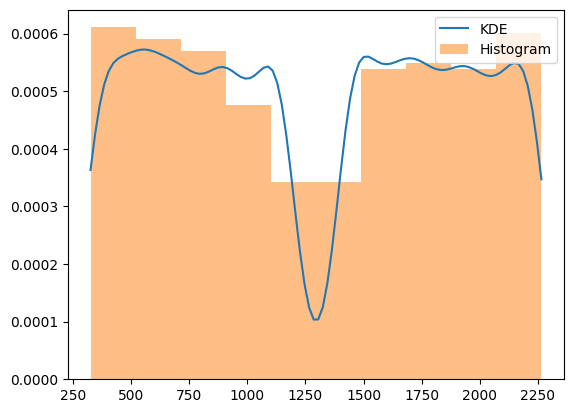

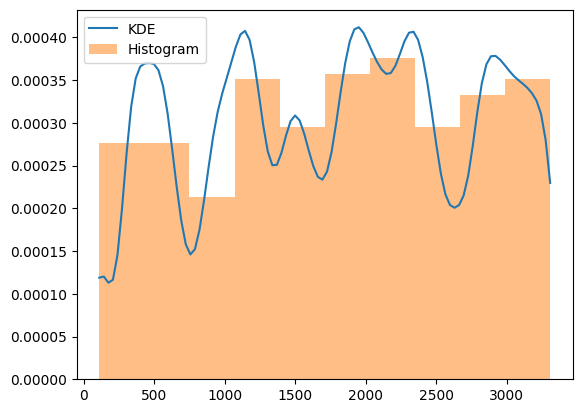

In [18]:
df = pd.read_csv('CSV/TLBR_68.csv')
img = cv2.imread('images/68.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=50)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=50)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[0]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1 = KDE()
kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

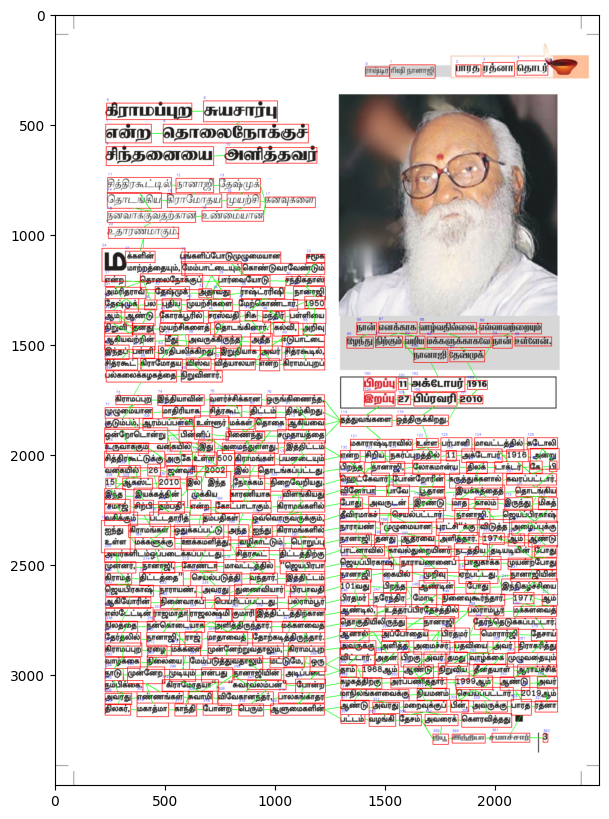

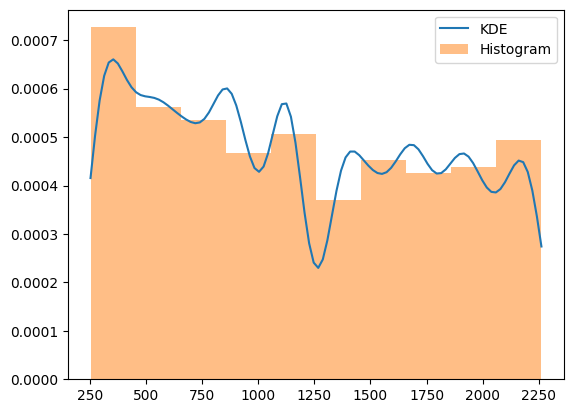

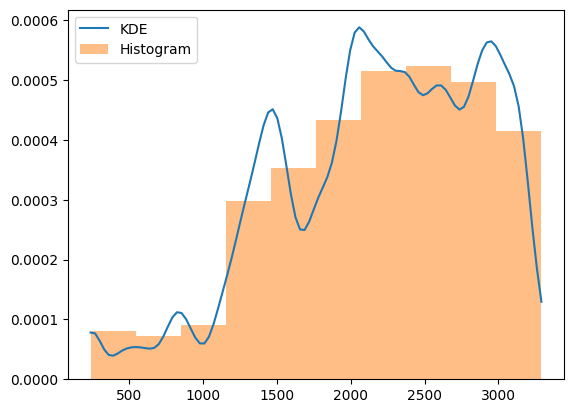

In [19]:
df = pd.read_csv('CSV/TLBR_201.csv')
img = cv2.imread('images/201.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=50)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=50)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[0]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1 = KDE()
kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

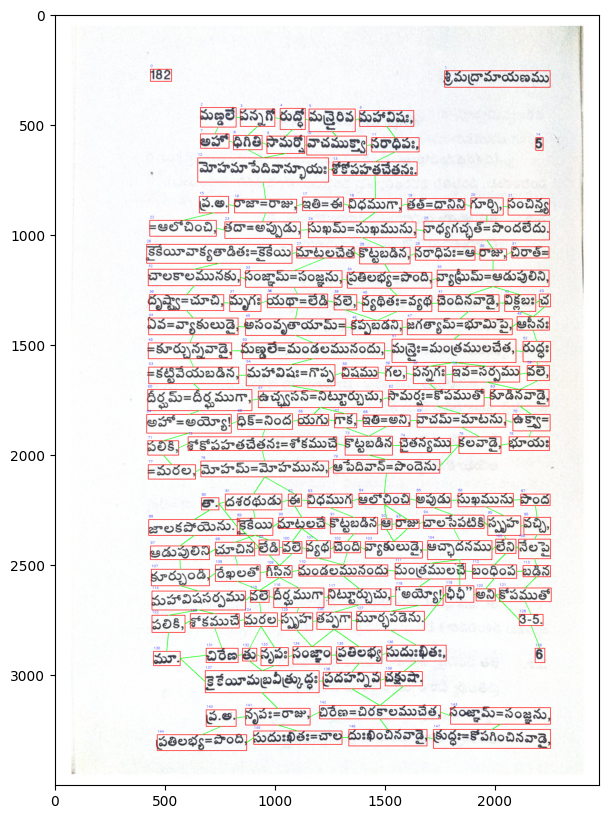

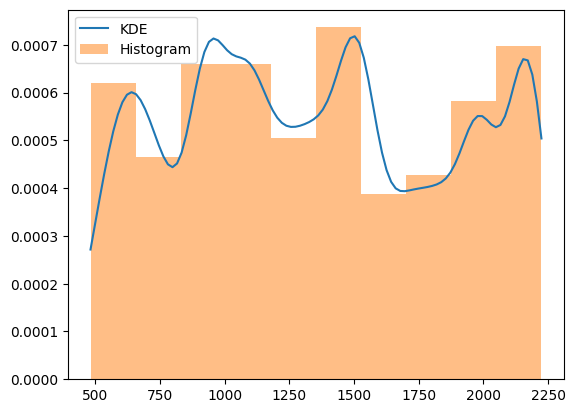

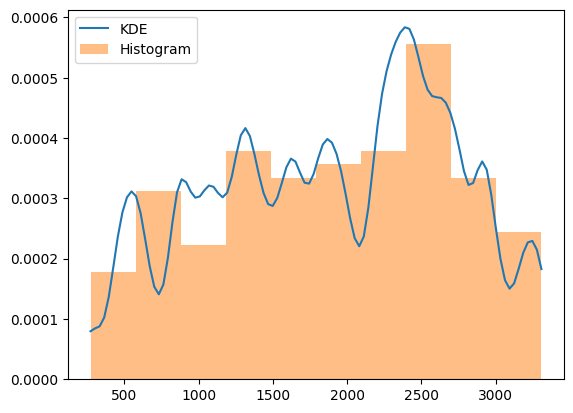

In [20]:
df = pd.read_csv('CSV/TLBR_152.csv')
img = cv2.imread('images/152.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=50)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=50)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[0]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1 = KDE()
kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

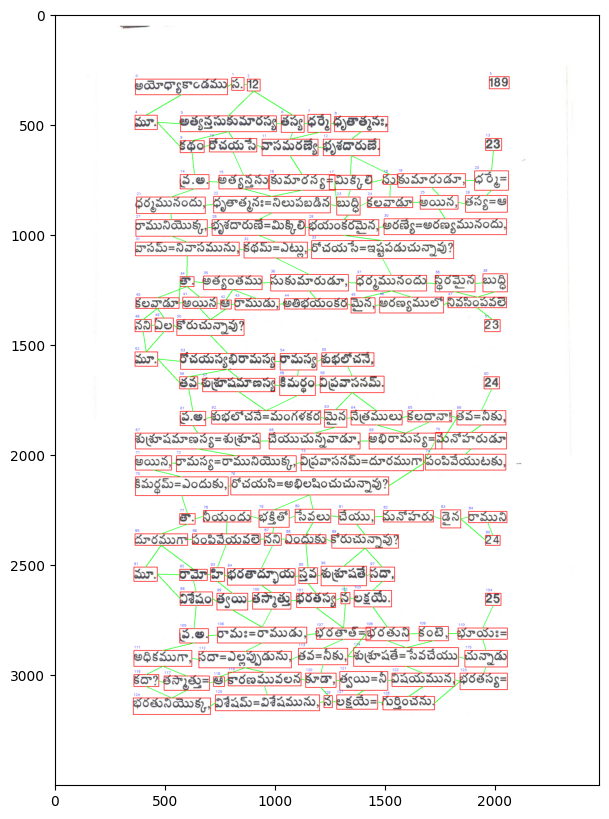

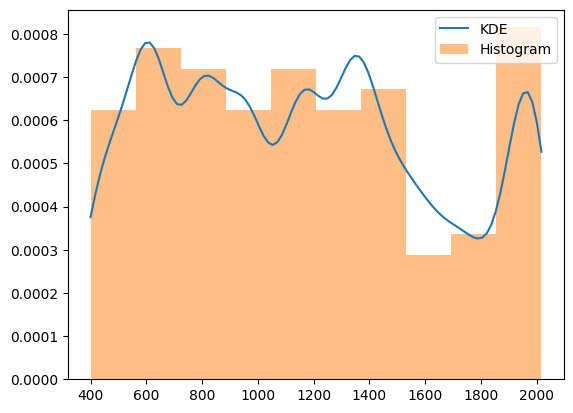

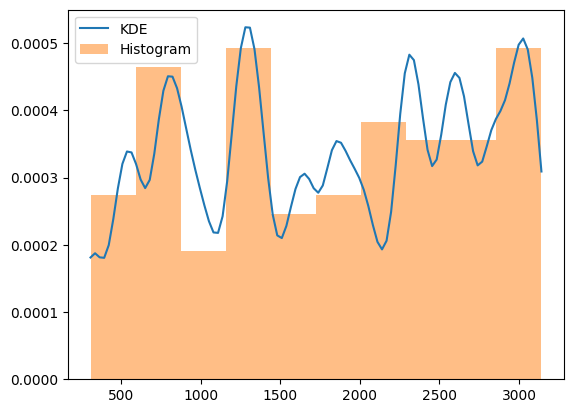

In [21]:
df = pd.read_csv('CSV/TLBR_159.csv')
img = cv2.imread('images/159.jpg')

Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

centres = get_centres(Top_left, bottom_right)


horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

kde3 = KDE(kernel = 'gaussian')
kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=50)
x_horizontal, y_horizontal = kde3.visualize(plot = False)

kde2 = KDE(kernel = 'gaussian')
kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=50)
x_vertical, y_vertical = kde2.visualize(plot = False)

horizontal_peaks, _ = find_peaks(y_horizontal)
vertical_peaks, _ = find_peaks(y_vertical)

if len(horizontal_peaks) > 1:
    horizontal_threshold = x_horizontal[horizontal_peaks[0]]
else:
    horizontal_threshold = 100  

if len(vertical_peaks) > 1:
    vertical_threshold = x_vertical[vertical_peaks[0]] 
else:
    vertical_threshold = 100


df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

df['Top_Box'] = get_top_box(df).tolist()
df['Bottom_Box'] = get_bottom_box(df).tolist()
df['Right_Box'] = get_right_box (df).tolist()
df['Left_Box'] = get_left_box(df).tolist()

img = make_connections(img, df)
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

kde1 = KDE()
kde1.fit(centres[:, 0].reshape(-1, 1), bandwidth=70)
kde1.visualize()

kde1.fit(centres[:, 1].reshape(-1, 1), bandwidth=70)
x, y = kde1.visualize()

Now let us compare the side by side outputs using KDE as well as Heirarchial Clustering.

In [22]:
def get_top_box1(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if df['cluster'][i] == df['cluster'][j] and i!=j:
                if df['Bottom'][j][1] > df['Top'][i][1]:
                    

                    dist = np.linalg.norm(np.array(df['Top'][i]) - np.array(df['Bottom'][j]))

                    if dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_bottom_box1(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if df['cluster'][i] == df['cluster'][j] and i!=j:
                if df['Top'][j][1] < df['Bottom'][i][1]:

                    dist = np.linalg.norm(np.array(df['Bottom'][i]) - np.array(df['Top'][j]))
                    
                    if dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_right_box1(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if df['cluster'][i] == df['cluster'][j] and i!=j:
                if df['Left'][j][0] > df['Right'][i][0]:

                    dist = np.linalg.norm(np.array(df['Right'][i]) - np.array(df['Left'][j]))

                    if dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances

def get_left_box1(df):
    min_distances = np.zeros((len(df), 2))
    min = 1e10
    idx = 0


    for i in range(len(df)):
        for j in range(len(df)):
            
            if df['cluster'][i] == df['cluster'][j] and i!=j:
                if df['Right'][j][0] < df['Left'][i][0]:

                    dist = np.linalg.norm(np.array(df['Left'][i]) - np.array(df['Right'][j]))

                    if dist<min and dist != 0:
                        min = dist
                        idx = j

        if min != 1e10:
            min_distances[i, 0] = min
            min_distances[i, 1] = df['Id'][idx]
        else:
            min_distances[i, 0] = -1
            min_distances[i, 1] = 0
        min = 1e10
    
    return min_distances



In [26]:
images = [('CSV/TLBR_29.csv', 'images/29.jpg'), ('CSV/TLBR_68.csv', 'images/68.jpg'), ('CSV/TLBR_145.csv', 'images/145.jpg'), ('CSV/TLBR_201.csv', 'images/201.jpg'), ('CSV/TLBR_232.csv', 'images/232.jpg'), ('CSV/TLBR_250.csv', 'images/250.jpg')]

ans = []

for i, (x, y) in enumerate(images):
    df = pd.read_csv(x)
    df1 = pd.read_csv(x)
    img = cv2.imread(y)


    Top_left = df['Top-Left'].apply(lambda x: ast.literal_eval(x))
    bottom_right = df['Bottom-Right'].apply(lambda x: ast.literal_eval(x))

    centres = get_centres(Top_left, bottom_right)


    horizontal_distances = np.abs(centres[:, 0] - centres[:, 0][:, np.newaxis])
    vertical_distances = np.abs(centres[:, 1] - centres[:, 1][:, np.newaxis])

    kde3 = KDE(kernel = 'gaussian')
    kde3.fit(horizontal_distances.reshape(-1, 1), bandwidth=15)
    x_horizontal, y_horizontal = kde3.visualize(plot = False)

    kde2 = KDE(kernel = 'gaussian')
    kde2.fit(vertical_distances.reshape(-1, 1), bandwidth=30)
    x_vertical, y_vertical = kde2.visualize(plot = False)

    horizontal_peaks, _ = find_peaks(y_horizontal)
    vertical_peaks, _ = find_peaks(y_vertical)

    if len(horizontal_peaks) > 1:
        horizontal_threshold = x_horizontal[2]
    else:
        horizontal_threshold = 100  

    if len(vertical_peaks) > 1:
        vertical_threshold = x_vertical[vertical_peaks[0]] 
    else:
        vertical_threshold = 100


    df['Top'] = get_top_edge(Top_left, bottom_right).tolist()
    df['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
    df['Right'] = get_right_edge(Top_left, bottom_right).tolist()
    df['Left'] = get_left_edge(Top_left, bottom_right).tolist()

    df1['Top'] = get_top_edge(Top_left, bottom_right).tolist()
    df1['Bottom'] = get_bottom_edge(Top_left, bottom_right).tolist()
    df1['Right'] = get_right_edge(Top_left, bottom_right).tolist()
    df1['Left'] = get_left_edge(Top_left, bottom_right).tolist()

    df['Top_Box'] = get_top_box(df).tolist()
    df['Bottom_Box'] = get_bottom_box(df).tolist()
    df['Right_Box'] = get_right_box (df).tolist()
    df['Left_Box'] = get_left_box(df).tolist()

    img1 = make_connections(img, df)

    z = linkage(centres,method='centroid', metric='euclidean')
    df1['cluster'] = fcluster(z, criterion='maxclust', t = 9)

    df1['Top_Box'] = get_top_box1(df1).tolist()
    df1['Bottom_Box'] = get_bottom_box1(df1).tolist()
    df1['Right_Box'] = get_right_box1(df1).tolist()
    df1['Left_Box'] = get_left_box1(df1).tolist()

    dfs = df1.drop('cluster', axis = 1)
    img2 = make_connections(img, dfs)

    ans.append((img1, img2))

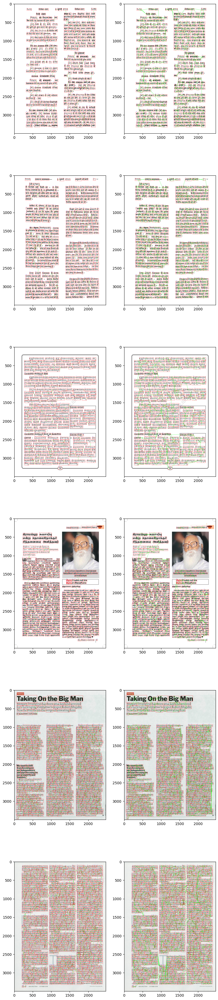

In [31]:
fig, axes = plt.subplots(6, 2, figsize = (10, 50))

for i, (img1, img2) in enumerate(ans):
    axes[i, 0].imshow(img1)
    axes[i, 1].imshow(img2)